In [7]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Sequential, layers
from tensorflow.keras import optimizers
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt
from matplotlib import pyplot
from numpy import expand_dims
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.callbacks import EarlyStopping


import os

In [8]:
# dimensions of our images.
img_width, img_height = 150, 150

train_data_dir = './raw_data/train_data/'
# validation_data_dir = './raw_data/test_data/'
nb_train_samples = len([name for name in os.listdir(train_data_dir) for name in os.listdir(train_data_dir + name)])
# nb_validation_samples = len([name for name in os.listdir(validation_data_dir) for name in os.listdir(validation_data_dir + name)])

batch_size = 20

input_shape = (img_width, img_height, 3)

In [5]:
# Check class name
# [name for name in os.listdir(train_data_dir) for name in os.listdir(train_data_dir)]

['Taeko Ohnuki - Aventure',
 'Tatsuro Yamashita - Softly',
 'Taeko Ohnuki - Cliché',
 'Tatsuro Yamashita - Moonglow',
 'Taeko Ohnuki - Romantique',
 'Utada Hikaru - Deep River',
 'Various - Classic Jazz-Funk Mastercuts Volume 7',
 'Anri (2) - Timely!!',
 'Taeko Ohnuki - Grey Skies',
 'Hiroshi Sato - Aqua',
 'Tatsuro Yamashita - Circus Town',
 'Mariya Takeuchi - Miss M',
 'Hiroshi Sato - Awakening',
 'Mariya Takeuchi - Trad = トラッド',
 'Momoko Kikuchi - Escape From Dimension',
 'Tatsuro Yamashita - For You',
 'Mariya Takeuchi - Beginning',
 'Hiroshi Sato - Future File',
 'Tatsuro Yamashita - On The Street Corner 2',
 'Taeko Ohnuki - Sunshower',
 'Utada Hikaru - Badモード',
 'Tatsuro Yamashita - Melodies',
 'Momoko Kikuchi - Adventure',
 'Hiroshi Sato - Sound Of Science',
 'Tatsuro Yamashita - Spacy',
 'Anri (2) - Bi・Ki・Ni',
 'Tatsuro Yamashita - Big Wave = ビッグウェイブ',
 '東北新幹線 - Thru Traffic',
 'Anri (2) - Coool',
 "Tatsuro Yamashita - It's A Poppin' Time",
 'Mariya Takeuchi - University Street

In [9]:
model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(41)) #class --> binary = 1 (0,1)
model.add(Activation('softmax')) #sigmoid

2022-09-01 18:59:23.087901: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-09-01 18:59:23.087986: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-09-01 18:59:23.088043: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Nathan): /proc/driver/nvidia/version does not exist
2022-09-01 18:59:23.088403: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [4]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 activation (Activation)     (None, 148, 148, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 32)        9248      
                                                                 
 activation_1 (Activation)   (None, 72, 72, 32)        0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 32)       0         
 2D)                                                    

In [5]:
model.compile(loss='categorical_crossentropy', # binary_crossentropy or categorical_crossentropy  
              optimizer='adam',# rmsprop or adagrad or  #adam
              metrics=['accuracy'])

In [10]:
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=[0.5,1.5], #zoom in, zoom out
    rotation_range=0.2,
    brightness_range=[0.8,1.1],
    fill_mode="constant",
    validation_split=0.3
    )


train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    shuffle=True,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training'
    ) #binary # categorical

validation_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation'
    ) #binary # categorical

#loop over the data in batches and this automatically saves the images



print(train_generator.class_indices)

Found 0 images belonging to 0 classes.
Found 0 images belonging to 0 classes.
{}


In [11]:
# #Generate augmented images
i = 0
for batch in train_datagen.flow_from_directory('./raw_data/train_data/', batch_size=15129,target_size=(150,150),
                           save_to_dir='./raw_data/train_data/', save_format='jpg'):
     i += 1
     if i > 5:
         break

Found 0 images belonging to 0 classes.


In [8]:
es = EarlyStopping(monitor = 'val_accuracy', 
                   mode = 'max', 
                   patience = 5, 
                   verbose = 1, 
                   restore_best_weights = True)

history = model.fit(
    train_generator,
    steps_per_epoch = train_generator.samples // batch_size,
    validation_data = validation_generator, 
    validation_steps = validation_generator.samples // batch_size,
    epochs = 50)

Epoch 1/50
73/73 [==============================] - 34s 460ms/step - loss: 0.7491 - accuracy: 0.7364 - val_loss: 0.0831 - val_accuracy: 0.9793
Epoch 2/50
73/73 [==============================] - 35s 486ms/step - loss: 0.7391 - accuracy: 0.7267 - val_loss: 0.1108 - val_accuracy: 0.9672
Epoch 3/50
73/73 [==============================] - 41s 558ms/step - loss: 0.7645 - accuracy: 0.7343 - val_loss: 0.0667 - val_accuracy: 0.9776
Epoch 4/50
73/73 [==============================] - 33s 443ms/step - loss: 0.7046 - accuracy: 0.7516 - val_loss: 0.0513 - val_accuracy: 0.9862
Epoch 5/50
73/73 [==============================] - 25s 339ms/step - loss: 0.6460 - accuracy: 0.7716 - val_loss: 0.0859 - val_accuracy: 0.9862
Epoch 6/50
73/73 [==============================] - 23s 321ms/step - loss: 0.6901 - accuracy: 0.7564 - val_loss: 0.0881 - val_accuracy: 0.9828
Epoch 7/50
73/73 [==============================] - 26s 360ms/step - loss: 0.6615 - accuracy: 0.7591 - val_loss: 0.0552 - val_accuracy: 0.9810

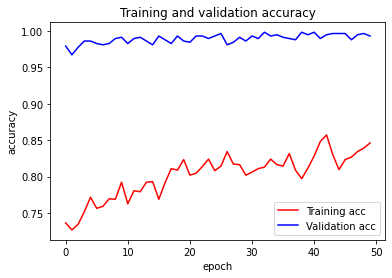

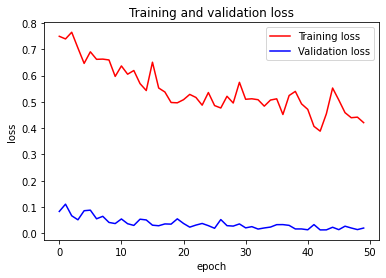

In [10]:
#Graphing our training and validation
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(acc))
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.ylabel('accuracy') 
plt.xlabel('epoch')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.ylabel('loss') 
plt.xlabel('epoch')
plt.legend()
plt.show()

In [11]:
model.save('model_vynil_22-08-25.h5')

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
import numpy as np
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt
import pandas as pd
import csv

2022-08-26 17:03:12.621733: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-08-26 17:03:12.717060: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-08-26 17:03:12.717115: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [3]:
with open("./annotated.csv", 'r') as file:
  csvreader = csv.reader(file)
  for row in csvreader:
    print(row)

['Class', 'File-name', 'class_num', 'class_concat']
['None', 'm99978540791.jpg', '-1', "'None':-1,"]
['None', 'm99098637207.jpg', '-1', "'None':-1,"]
['None', 'm96578429957.jpg', '-1', "'None':-1,"]
['None', 'm96466080135.jpg', '-1', "'None':-1,"]
['Anri (2) - Timely!!', 'm95839112261.jpg', '2', "'Anri (2) - Timely!!':2,"]
['None', 'm95634696809.jpg', '-1', "'None':-1,"]
['Tatsuro Yamashita - Big Wave = ビッグウェイブ', 'm95625025814.jpg', '24', "'Tatsuro Yamashita - Big Wave = ビッグウェイブ':24,"]
['Tatsuro Yamashita - Spacy', 'm95517704439.jpg', '35', "'Tatsuro Yamashita - Spacy':35,"]
['Tatsuro Yamashita - Melodies', 'm95500282369.jpg', '29', "'Tatsuro Yamashita - Melodies':29,"]
['Tatsuro Yamashita - Big Wave = ビッグウェイブ', 'm95201887356.jpg', '24', "'Tatsuro Yamashita - Big Wave = ビッグウェイブ':24,"]
['Tatsuro Yamashita - Go Ahead!', 'm94222835900.jpg', '27', "'Tatsuro Yamashita - Go Ahead!':27,"]
['Anri (2) - Coool', 'm93963960611.jpg', '1', "'Anri (2) - Coool':1,"]
['Anri (2) - Timely!!', 'm93923434

In [7]:
# dimensions of our images
img_width, img_height = 150, 150

# load the model we saved
model = load_model('model_vynil_22-8-25.h5')

2022-08-26 17:03:51.236089: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-08-26 17:03:51.236327: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2022-08-26 17:03:51.236405: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (Kuma-HPPavilion): /proc/driver/nvidia/version does not exist
2022-08-26 17:03:51.242021: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [8]:
df = pd.read_csv("./annotated.csv", index_col='File-name')

In [9]:
df.head()

,Class,class_num,class_concat
File-name,,,
m99978540791.jpg,None,-1.0,"'None':-1,"
m99098637207.jpg,None,-1.0,"'None':-1,"
m96578429957.jpg,None,-1.0,"'None':-1,"
m96466080135.jpg,None,-1.0,"'None':-1,"
m95839112261.jpg,Anri (2) - Timely!!,2.0,"'Anri (2) - Timely!!':2,"


['m99978540791.jpg', 'm53243629811.jpg', 'm38771948280.jpg', 'm10503854020.jpg', 'm29950335741.jpg', 'm72908875731.jpg', 'm65436610576.jpg', 'm25074840304.jpg', 'm11956445589.jpg', 'm63023392431.jpg', 'm23638748572.jpg', 'm50771184370.jpg', 'm45642271858.jpg', 'm39981932159.jpg', 'm82296285274.jpg', 'm43543676510.jpg', 'm61164432023.jpg', 'm29119208452.jpg', 'm17274960811.jpg', 'm41761078299.jpg', 'm53525627772.jpg', 'm39915736818.jpg', 'm30818047931.jpg', 'm91504947941.jpg', 'm59500847829.jpg', 'm72144546106.jpg', 'm49377627992.jpg', 'm79853025927.jpg', 'm95634696809.jpg', 'm65154901895.jpg', 'm80355291173.jpg', 'm42821800291.jpg', 'm75701026077.jpg', 'm99098637207.jpg', 'm19509388989.jpg', 'm10012187550.jpg', 'm96578429957.jpg', 'm18720760061.jpg', 'm31052956154.jpg', 'm12020166923.jpg', 'm16845919052.jpg', 'm38850206522.jpg', 'm70387931244.jpg', 'm62966640085.jpg', 'm36345618234.jpg', 'm18466188311.jpg', 'm64031157958.jpg', 'm51335679249.jpg', 'm46935897438.jpg', 'm61122959523.jpg',

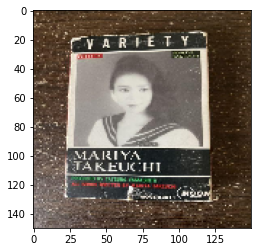

1/1 [==============================] - 0s 32ms/step
Cannot define , 49.17
m99978540791.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m53243629811.jpg


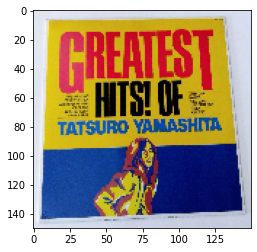

1/1 [==============================] - 0s 33ms/step
Tatsuro Yamashita - Melodies , 100.00
m53243629811.jpg: Tatsuro Yamashita - Melodies
False
 
--------------------------------------------------------------
 
File name : m38771948280.jpg


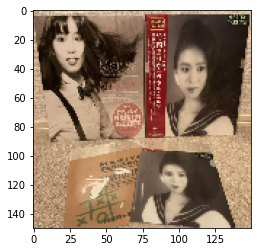

1/1 [==============================] - 0s 28ms/step
Mariya Takeuchi - University Street , 86.96
m38771948280.jpg: Mariya Takeuchi - University Street
False
 
--------------------------------------------------------------
 
File name : m10503854020.jpg


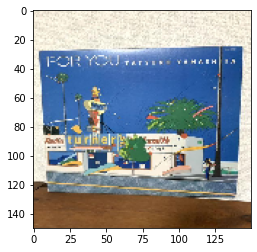

1/1 [==============================] - 0s 44ms/step
Tatsuro Yamashita - For You , 73.32
m10503854020.jpg: Tatsuro Yamashita - For You
True
 
--------------------------------------------------------------
 
File name : m29950335741.jpg


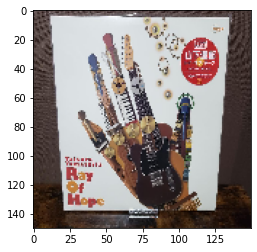

1/1 [==============================] - 0s 38ms/step
Cannot define , 46.72
m29950335741.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m72908875731.jpg


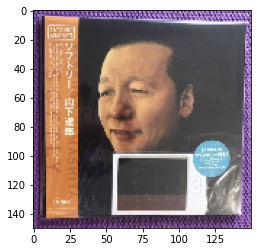

1/1 [==============================] - 0s 40ms/step
Tatsuro Yamashita - Softly , 87.23
m72908875731.jpg: Tatsuro Yamashita - Softly
True
 
--------------------------------------------------------------
 
File name : m65436610576.jpg


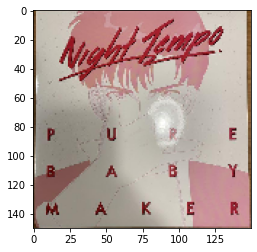

1/1 [==============================] - 0s 41ms/step
Utada Hikaru - Badモード , 78.23
m65436610576.jpg: Utada Hikaru - Badモード
False
 
--------------------------------------------------------------
 
File name : m25074840304.jpg


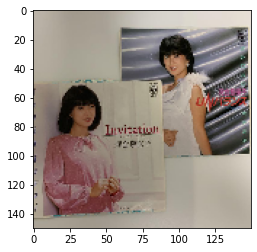

1/1 [==============================] - 0s 30ms/step
Cannot define , 54.21
m25074840304.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m11956445589.jpg


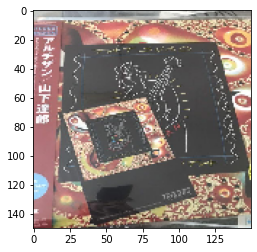

1/1 [==============================] - 0s 33ms/step
Cannot define , 49.12
m11956445589.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m63023392431.jpg


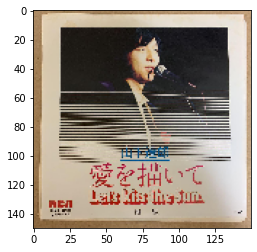

1/1 [==============================] - 0s 32ms/step
Taeko Ohnuki - Sunshower , 99.90
m63023392431.jpg: Taeko Ohnuki - Sunshower
False
 
--------------------------------------------------------------
 
File name : m23638748572.jpg


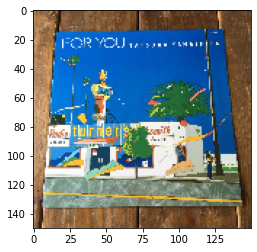

1/1 [==============================] - 0s 28ms/step
Tatsuro Yamashita - For You , 99.91
m23638748572.jpg: Tatsuro Yamashita - For You
True
 
--------------------------------------------------------------
 
File name : m50771184370.jpg


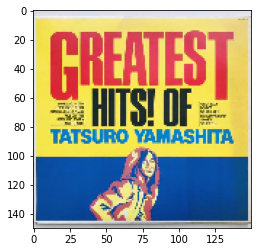

1/1 [==============================] - 0s 25ms/step
Tatsuro Yamashita - Melodies , 100.00
m50771184370.jpg: Tatsuro Yamashita - Melodies
False
 
--------------------------------------------------------------
 
File name : m45642271858.jpg


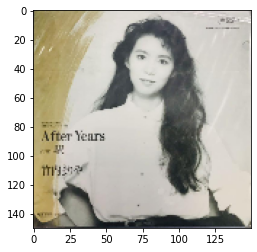

1/1 [==============================] - 0s 33ms/step
Cannot define , 69.78
m45642271858.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m39981932159.jpg


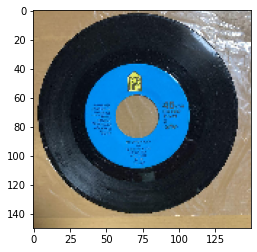

1/1 [==============================] - 0s 30ms/step
Tatsuro Yamashita - Big Wave = ビッグウェイブ , 99.99
m39981932159.jpg: Tatsuro Yamashita - Big Wave = ビッグウェイブ
False
 
--------------------------------------------------------------
 
File name : m82296285274.jpg


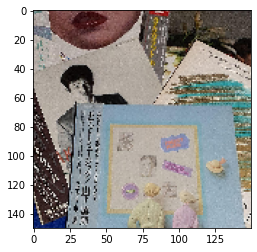

1/1 [==============================] - 0s 25ms/step
Taeko Ohnuki - Sunshower , 78.21
m82296285274.jpg: Taeko Ohnuki - Sunshower
False
 
--------------------------------------------------------------
 
File name : m43543676510.jpg


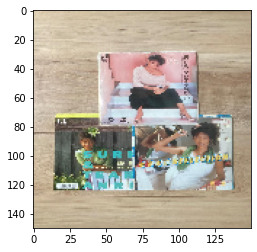

1/1 [==============================] - 0s 26ms/step
Cannot define , 25.85
m43543676510.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m61164432023.jpg


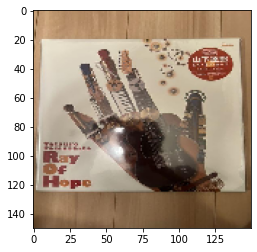

1/1 [==============================] - 0s 29ms/step
Cannot define , 20.61
m61164432023.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m29119208452.jpg


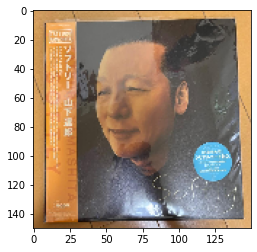

1/1 [==============================] - 0s 26ms/step
Tatsuro Yamashita - Softly , 95.10
m29119208452.jpg: Tatsuro Yamashita - Softly
True
 
--------------------------------------------------------------
 
File name : m17274960811.jpg


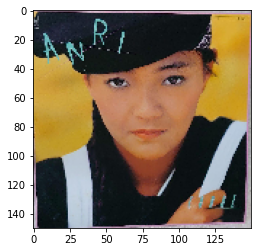

1/1 [==============================] - 0s 29ms/step
Anri (2) - Coool , 100.00
m17274960811.jpg: Anri (2) - Coool
True
 
--------------------------------------------------------------
 
File name : m41761078299.jpg


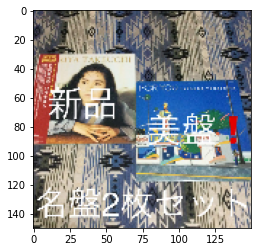

1/1 [==============================] - 0s 39ms/step
Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線 , 81.38
m41761078299.jpg: Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線
False
 
--------------------------------------------------------------
 
File name : m53525627772.jpg


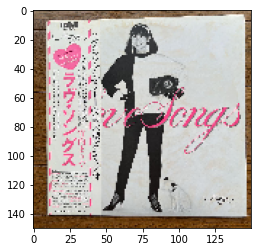

1/1 [==============================] - 0s 30ms/step
Mariya Takeuchi - Love Songs , 100.00
m53525627772.jpg: Mariya Takeuchi - Love Songs
False
 
--------------------------------------------------------------
 
File name : m39915736818.jpg


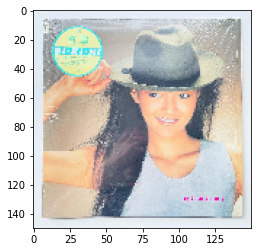

1/1 [==============================] - 0s 30ms/step
Cannot define , 46.60
m39915736818.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m30818047931.jpg


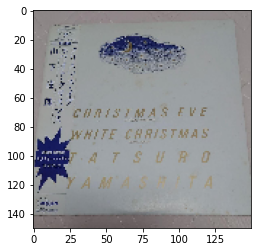

1/1 [==============================] - 0s 27ms/step
Cannot define , 56.22
m30818047931.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m91504947941.jpg


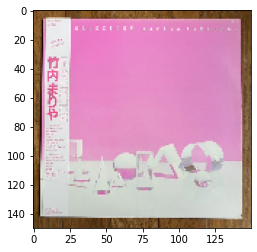

1/1 [==============================] - 0s 33ms/step
Momoko Kikuchi - Adventure , 86.46
m91504947941.jpg: Momoko Kikuchi - Adventure
False
 
--------------------------------------------------------------
 
File name : m59500847829.jpg


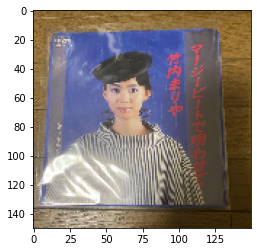

1/1 [==============================] - 0s 30ms/step
Cannot define , 37.21
m59500847829.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m72144546106.jpg


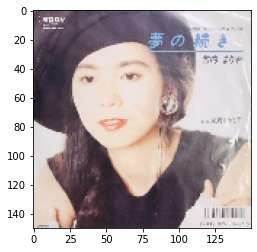

1/1 [==============================] - 0s 32ms/step
Taeko Ohnuki - Sunshower , 85.95
m72144546106.jpg: Taeko Ohnuki - Sunshower
False
 
--------------------------------------------------------------
 
File name : m49377627992.jpg


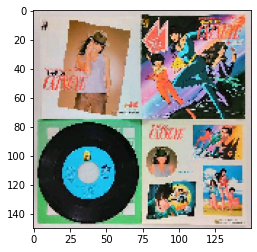

1/1 [==============================] - 0s 30ms/step
Tatsuro Yamashita - Moonglow , 81.86
m49377627992.jpg: Tatsuro Yamashita - Moonglow
False
 
--------------------------------------------------------------
 
File name : m79853025927.jpg


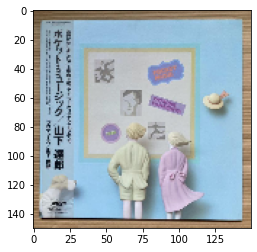

1/1 [==============================] - 0s 28ms/step
Cannot define , 45.23
m79853025927.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m95634696809.jpg


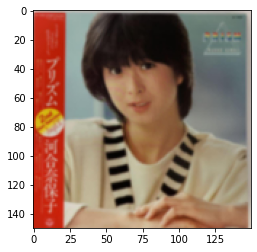

1/1 [==============================] - 0s 39ms/step
Cannot define , 58.53
m95634696809.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m65154901895.jpg


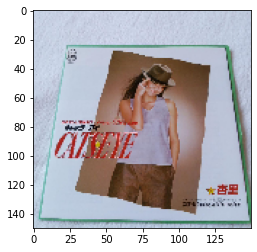

1/1 [==============================] - 0s 25ms/step
Cannot define , 63.50
m65154901895.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m80355291173.jpg


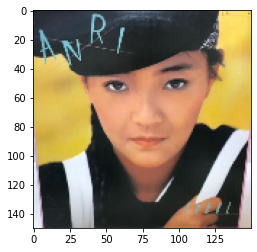

1/1 [==============================] - 0s 38ms/step
Cannot define , 63.50
m80355291173.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m42821800291.jpg


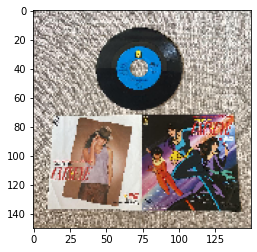

1/1 [==============================] - 0s 35ms/step
Cannot define , 51.26
m42821800291.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m75701026077.jpg


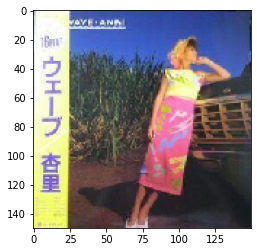

1/1 [==============================] - 0s 31ms/step
Anri (2) - Wave , 100.00
m75701026077.jpg: Anri (2) - Wave
True
 
--------------------------------------------------------------
 
File name : m99098637207.jpg


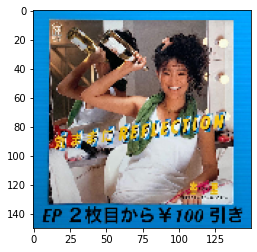

1/1 [==============================] - 0s 30ms/step
Anri (2) - Wave , 82.41
m99098637207.jpg: Anri (2) - Wave
False
 
--------------------------------------------------------------
 
File name : m19509388989.jpg


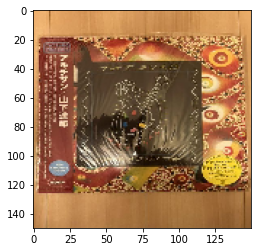

1/1 [==============================] - 0s 34ms/step
Cannot define , 47.06
m19509388989.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m10012187550.jpg


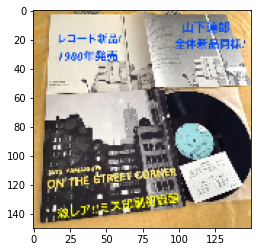

1/1 [==============================] - 0s 35ms/step
Tatsuro Yamashita - On The Street Corner , 100.00
m10012187550.jpg: Tatsuro Yamashita - On The Street Corner
True
 
--------------------------------------------------------------
 
File name : m96578429957.jpg


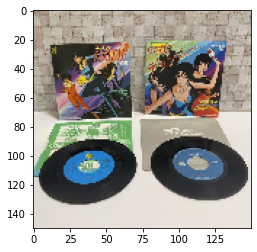

1/1 [==============================] - 0s 34ms/step
Cannot define , 69.17
m96578429957.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m18720760061.jpg


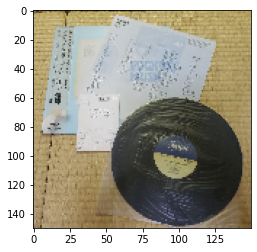

1/1 [==============================] - 0s 36ms/step
Cannot define , 67.96
m18720760061.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m31052956154.jpg


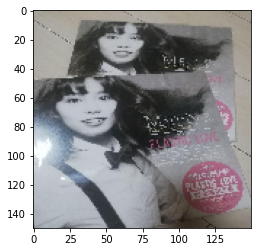

1/1 [==============================] - 0s 26ms/step
Mariya Takeuchi - Love Songs , 88.51
m31052956154.jpg: Mariya Takeuchi - Love Songs
False
 
--------------------------------------------------------------
 
File name : m12020166923.jpg


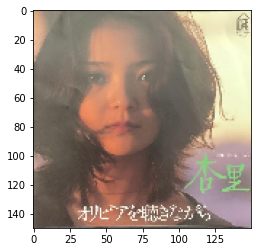

1/1 [==============================] - 0s 31ms/step
Taeko Ohnuki - Grey Skies , 92.32
m12020166923.jpg: Taeko Ohnuki - Grey Skies
False
 
--------------------------------------------------------------
 
File name : m16845919052.jpg


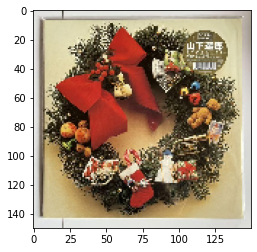

1/1 [==============================] - 0s 30ms/step
Anri (2) - Coool , 83.29
m16845919052.jpg: Anri (2) - Coool
False
 
--------------------------------------------------------------
 
File name : m38850206522.jpg


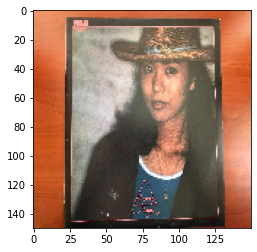

1/1 [==============================] - 0s 28ms/step
Cannot define , 27.17
m38850206522.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m70387931244.jpg


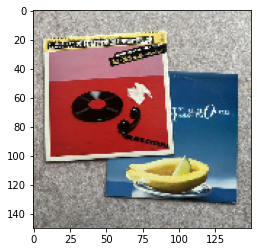

1/1 [==============================] - 0s 37ms/step
Anri (2) - Coool , 93.63
m70387931244.jpg: Anri (2) - Coool
False
 
--------------------------------------------------------------
 
File name : m62966640085.jpg


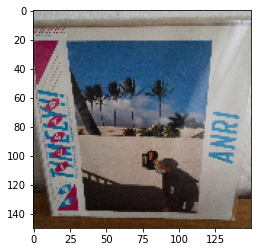

1/1 [==============================] - 0s 34ms/step
Cannot define , 69.30
m62966640085.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m36345618234.jpg


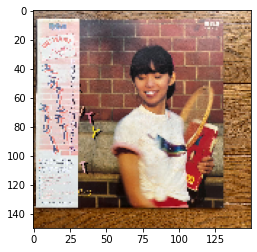

1/1 [==============================] - 0s 25ms/step
Mariya Takeuchi - University Street , 99.97
m36345618234.jpg: Mariya Takeuchi - University Street
True
 
--------------------------------------------------------------
 
File name : m18466188311.jpg


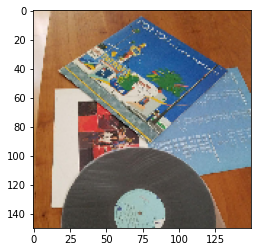

1/1 [==============================] - 0s 37ms/step
Cannot define , 23.27
m18466188311.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m64031157958.jpg


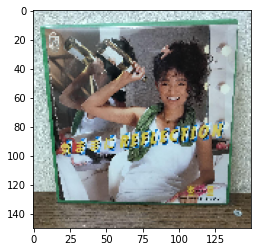

1/1 [==============================] - 0s 33ms/step
Cannot define , 29.63
m64031157958.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m51335679249.jpg


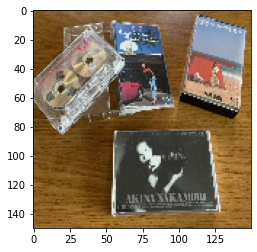

1/1 [==============================] - 0s 35ms/step
Cannot define , 64.32
m51335679249.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m46935897438.jpg


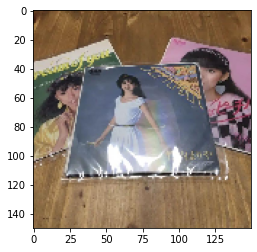

1/1 [==============================] - 0s 35ms/step
Cannot define , 68.61
m46935897438.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m61122959523.jpg


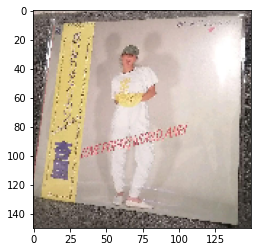

1/1 [==============================] - 0s 36ms/step
Cannot define , 54.40
m61122959523.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m35721748736.jpg


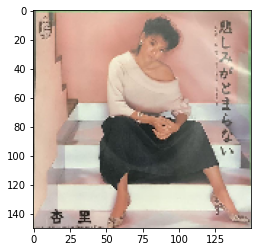

1/1 [==============================] - 0s 36ms/step
Cannot define , 28.16
m35721748736.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m16435213736.jpg


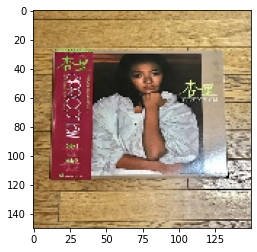

1/1 [==============================] - 0s 33ms/step
Mariya Takeuchi - University Street , 90.58
m16435213736.jpg: Mariya Takeuchi - University Street
False
 
--------------------------------------------------------------
 
File name : m95839112261.jpg


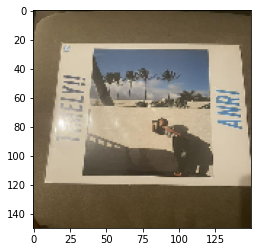

1/1 [==============================] - 0s 27ms/step
Taeko Ohnuki - Sunshower , 84.29
m95839112261.jpg: Taeko Ohnuki - Sunshower
False
 
--------------------------------------------------------------
 
File name : m13724146311.jpg


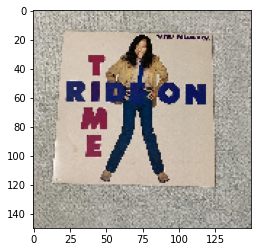

1/1 [==============================] - 0s 39ms/step
Cannot define , 35.41
m13724146311.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m26416702670.jpg


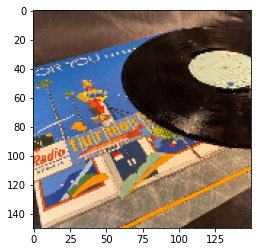

1/1 [==============================] - 0s 49ms/step
Mariya Takeuchi - Miss M , 86.82
m26416702670.jpg: Mariya Takeuchi - Miss M
False
 
--------------------------------------------------------------
 
File name : m93963960611.jpg


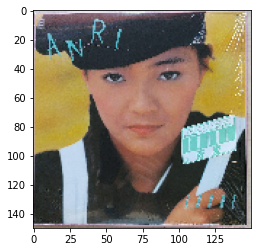

1/1 [==============================] - 0s 35ms/step
Anri (2) - Coool , 98.25
m93963960611.jpg: Anri (2) - Coool
True
 
--------------------------------------------------------------
 
File name : m27373947614.jpg


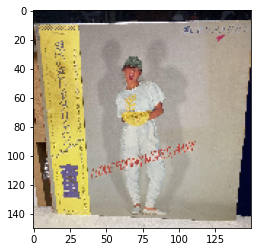

1/1 [==============================] - 0s 35ms/step
Cannot define , 34.20
m27373947614.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m74284439441.jpg


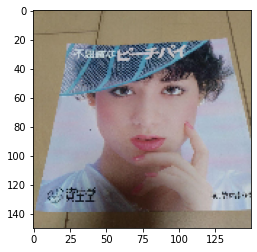

1/1 [==============================] - 0s 47ms/step
Cannot define , 40.37
m74284439441.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m12124050245.jpg


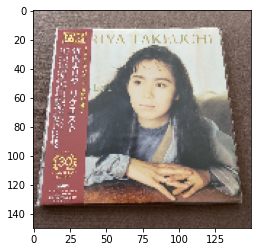

1/1 [==============================] - 0s 32ms/step
Cannot define , 59.21
m12124050245.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m81319532756.jpg


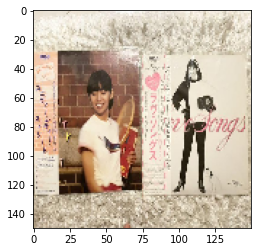

1/1 [==============================] - 0s 33ms/step
Cannot define , 28.10
m81319532756.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m15681943279.jpg


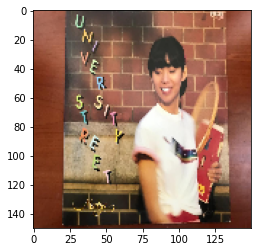

1/1 [==============================] - 0s 32ms/step
Mariya Takeuchi - University Street , 99.81
m15681943279.jpg: Mariya Takeuchi - University Street
True
 
--------------------------------------------------------------
 
File name : m40322257412.jpg


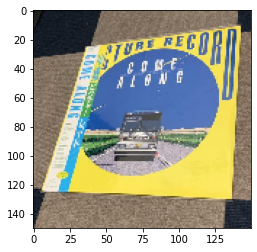

1/1 [==============================] - 0s 31ms/step
Hiroshi Sato - Aqua , 94.63
m40322257412.jpg: Hiroshi Sato - Aqua
False
 
--------------------------------------------------------------
 
File name : m85801971334.jpg


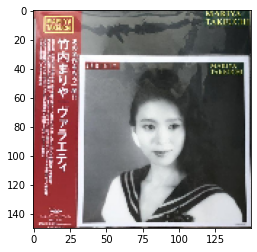

1/1 [==============================] - 0s 25ms/step
Cannot define , 55.51
m85801971334.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m16425870820.jpg


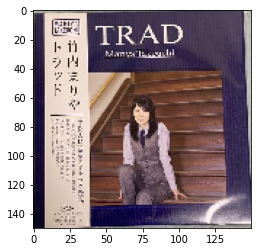

1/1 [==============================] - 0s 29ms/step
Mariya Takeuchi - Trad = トラッド , 99.37
m16425870820.jpg: Mariya Takeuchi - Trad = トラッド
True
 
--------------------------------------------------------------
 
File name : m87548172008.jpg


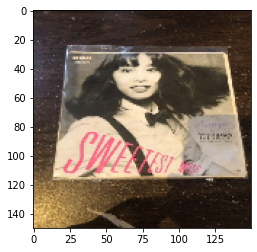

1/1 [==============================] - 0s 37ms/step
Cannot define , 46.97
m87548172008.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m39694634191.jpg


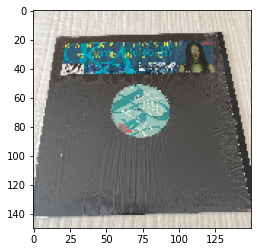

1/1 [==============================] - 0s 29ms/step
Cannot define , 69.17
m39694634191.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m17688570037.jpg


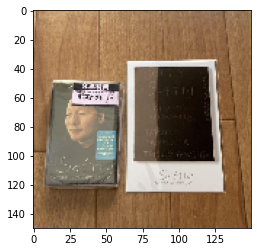

1/1 [==============================] - 0s 27ms/step
Cannot define , 47.08
m17688570037.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m88584493281.jpg


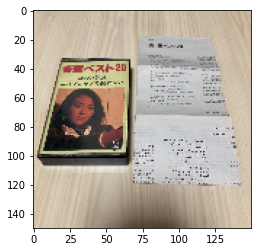

1/1 [==============================] - 0s 27ms/step
Taeko Ohnuki - Grey Skies , 99.23
m88584493281.jpg: Taeko Ohnuki - Grey Skies
False
 
--------------------------------------------------------------
 
File name : m25372332437.jpg


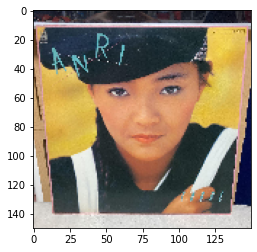

1/1 [==============================] - 0s 27ms/step
Anri (2) - Coool , 97.15
m25372332437.jpg: Anri (2) - Coool
True
 
--------------------------------------------------------------
 
File name : m40577213267.jpg


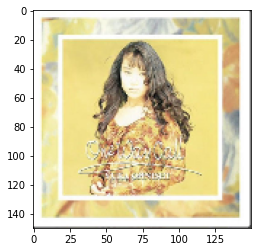

1/1 [==============================] - 0s 35ms/step
Cannot define , 48.88
m40577213267.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m38189604327.jpg


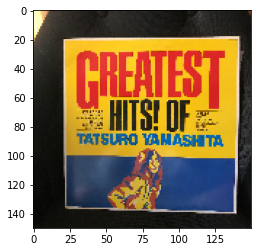

1/1 [==============================] - 0s 40ms/step
Tatsuro Yamashita - Melodies , 99.99
m38189604327.jpg: Tatsuro Yamashita - Melodies
False
 
--------------------------------------------------------------
 
File name : m41041869320.jpg


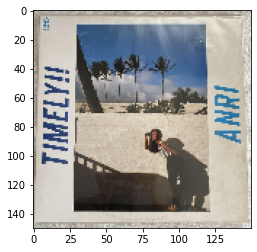

1/1 [==============================] - 0s 30ms/step
Anri (2) - Timely!! , 99.99
m41041869320.jpg: Anri (2) - Timely!!
True
 
--------------------------------------------------------------
 
File name : m17119315639.jpg


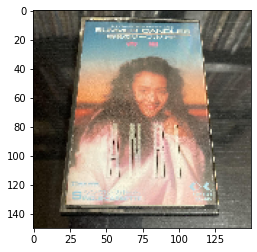

1/1 [==============================] - 0s 45ms/step
Cannot define , 29.98
m17119315639.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m74591623251.jpg


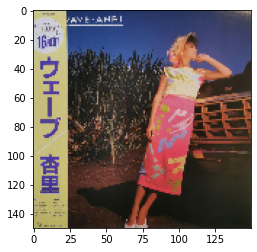

1/1 [==============================] - 0s 40ms/step
Anri (2) - Wave , 99.93
m74591623251.jpg: Anri (2) - Wave
True
 
--------------------------------------------------------------
 
File name : m83491343561.jpg


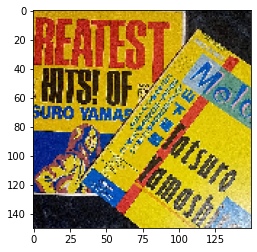

1/1 [==============================] - 0s 29ms/step
Tatsuro Yamashita - Melodies , 100.00
m83491343561.jpg: Tatsuro Yamashita - Melodies
False
 
--------------------------------------------------------------
 
File name : m24640199470.jpg


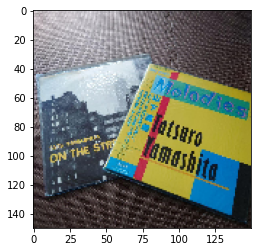

1/1 [==============================] - 0s 32ms/step
Tatsuro Yamashita - Melodies , 100.00
m24640199470.jpg: Tatsuro Yamashita - Melodies
False
 
--------------------------------------------------------------
 
File name : m66112755294.jpg


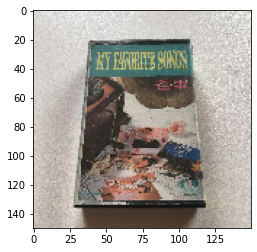

1/1 [==============================] - 0s 32ms/step
Taeko Ohnuki - Grey Skies , 70.29
m66112755294.jpg: Taeko Ohnuki - Grey Skies
False
 
--------------------------------------------------------------
 
File name : m88129844754.jpg


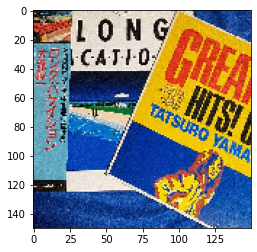

1/1 [==============================] - 0s 32ms/step
Tatsuro Yamashita - Melodies , 99.97
m88129844754.jpg: Tatsuro Yamashita - Melodies
False
 
--------------------------------------------------------------
 
File name : m75598620462.jpg


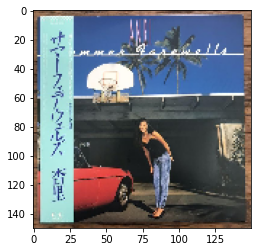

1/1 [==============================] - 0s 41ms/step
Cannot define , 57.20
m75598620462.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m95500282369.jpg


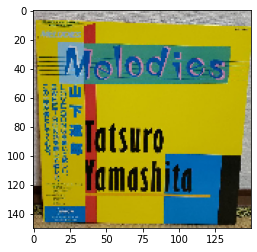

1/1 [==============================] - 0s 29ms/step
Tatsuro Yamashita - Melodies , 100.00
m95500282369.jpg: Tatsuro Yamashita - Melodies
True
 
--------------------------------------------------------------
 
File name : m56764502742.jpg


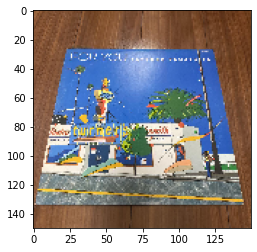

1/1 [==============================] - 0s 29ms/step
Cannot define , 50.07
m56764502742.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m30413324052.jpg


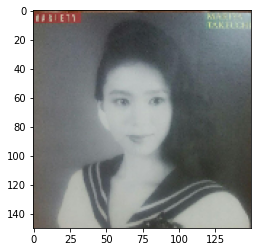

1/1 [==============================] - 0s 36ms/step
Tatsuro Yamashita - Ride On Time , 93.81
m30413324052.jpg: Tatsuro Yamashita - Ride On Time
False
 
--------------------------------------------------------------
 
File name : m84281438794.jpg


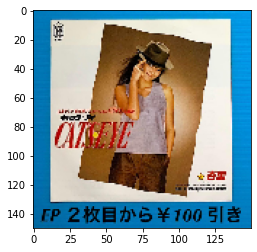

1/1 [==============================] - 0s 28ms/step
Tatsuro Yamashita - It's A Poppin' Time , 90.41
m84281438794.jpg: Tatsuro Yamashita - It's A Poppin' Time
False
 
--------------------------------------------------------------
 
File name : m25309952882.jpg


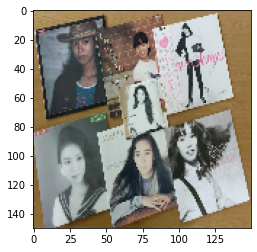

1/1 [==============================] - 0s 33ms/step
Cannot define , 64.41
m25309952882.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m31587442726.jpg


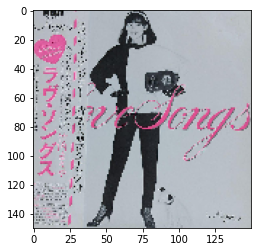

1/1 [==============================] - 0s 35ms/step
Mariya Takeuchi - Love Songs , 100.00
m31587442726.jpg: Mariya Takeuchi - Love Songs
True
 
--------------------------------------------------------------
 
File name : m45086183976.jpg


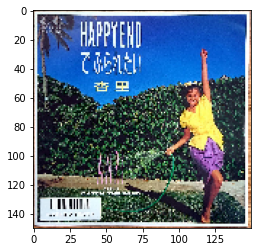

1/1 [==============================] - 0s 27ms/step
Tatsuro Yamashita - For You , 99.48
m45086183976.jpg: Tatsuro Yamashita - For You
False
 
--------------------------------------------------------------
 
File name : m70212275506.jpg


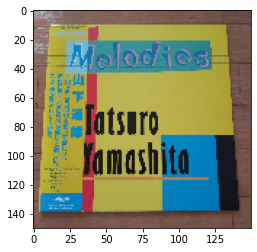

1/1 [==============================] - 0s 25ms/step
Tatsuro Yamashita - Melodies , 100.00
m70212275506.jpg: Tatsuro Yamashita - Melodies
True
 
--------------------------------------------------------------
 
File name : m20865534211.jpg


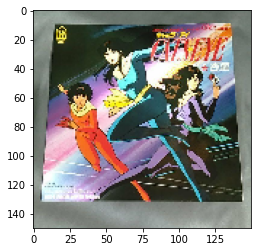

1/1 [==============================] - 0s 32ms/step
Tatsuro Yamashita - Spacy , 79.31
m20865534211.jpg: Tatsuro Yamashita - Spacy
False
 
--------------------------------------------------------------
 
File name : m29363062369.jpg


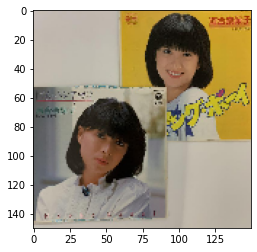

1/1 [==============================] - 0s 36ms/step
Mariya Takeuchi - Request , 83.05
m29363062369.jpg: Mariya Takeuchi - Request
False
 
--------------------------------------------------------------
 
File name : m93408328181.jpg


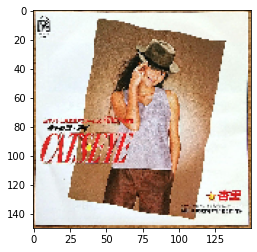

1/1 [==============================] - 0s 28ms/step
Cannot define , 50.86
m93408328181.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m20837153021.jpg


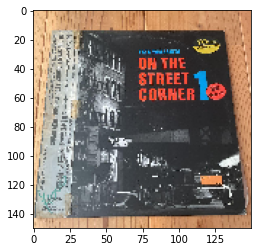

1/1 [==============================] - 0s 29ms/step
Cannot define , 48.35
m20837153021.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m43503908106.jpg


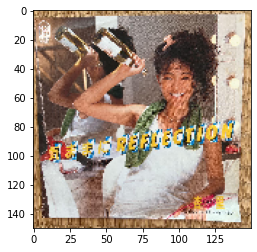

1/1 [==============================] - 0s 29ms/step
Mariya Takeuchi - University Street , 70.60
m43503908106.jpg: Mariya Takeuchi - University Street
False
 
--------------------------------------------------------------
 
File name : m22423678417.jpg


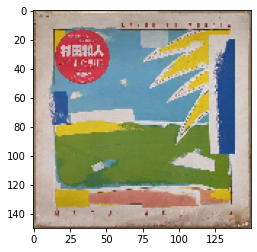

1/1 [==============================] - 0s 30ms/step
Tatsuro Yamashita - Spacy , 80.74
m22423678417.jpg: Tatsuro Yamashita - Spacy
False
 
--------------------------------------------------------------
 
File name : m65788429964.jpg


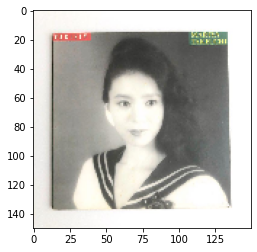

1/1 [==============================] - 0s 38ms/step
Cannot define , 49.15
m65788429964.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m87168627374.jpg


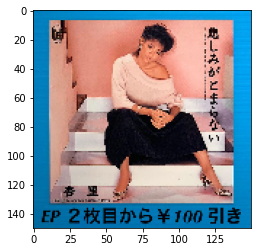

1/1 [==============================] - 0s 41ms/step
Tatsuro Yamashita - On The Street Corner 2 , 99.46
m87168627374.jpg: Tatsuro Yamashita - On The Street Corner 2
False
 
--------------------------------------------------------------
 
File name : m52820097630.jpg


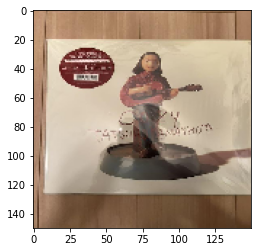

1/1 [==============================] - 0s 30ms/step
Cannot define , 59.91
m52820097630.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m36318346744.jpg


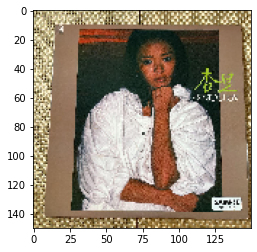

1/1 [==============================] - 0s 30ms/step
Mariya Takeuchi - University Street , 83.25
m36318346744.jpg: Mariya Takeuchi - University Street
False
 
--------------------------------------------------------------
 
File name : m15659786712.jpg


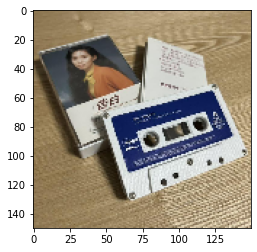

1/1 [==============================] - 0s 30ms/step
Cannot define , 52.54
m15659786712.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m27008227029.jpg


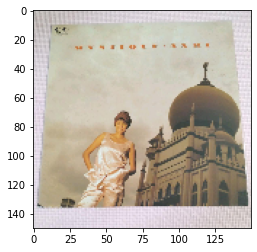

1/1 [==============================] - 0s 27ms/step
Utada Hikaru - Badモード , 92.84
m27008227029.jpg: Utada Hikaru - Badモード
False
 
--------------------------------------------------------------
 
File name : m10304734067.jpg


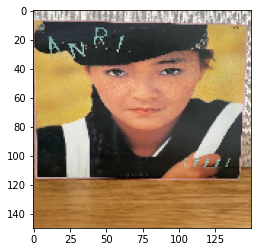

1/1 [==============================] - 0s 35ms/step
Cannot define , 59.94
m10304734067.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m61759563481.jpg


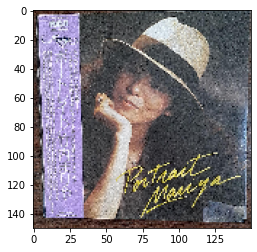

1/1 [==============================] - 0s 30ms/step
Tatsuro Yamashita - On The Street Corner , 94.09
m61759563481.jpg: Tatsuro Yamashita - On The Street Corner
False
 
--------------------------------------------------------------
 
File name : m49044580256.jpg


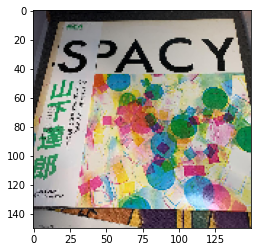

1/1 [==============================] - 0s 33ms/step
Tatsuro Yamashita - Spacy , 96.20
m49044580256.jpg: Tatsuro Yamashita - Spacy
True
 
--------------------------------------------------------------
 
File name : m11759412689.jpg


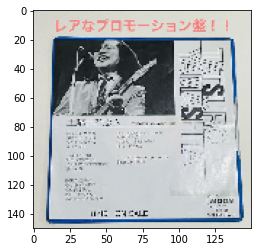

1/1 [==============================] - 0s 28ms/step
Taeko Ohnuki - Sunshower , 97.18
m11759412689.jpg: Taeko Ohnuki - Sunshower
False
 
--------------------------------------------------------------
 
File name : m72904340935.jpg


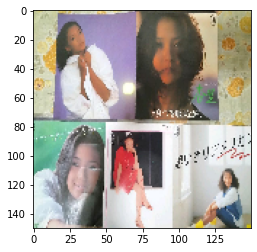

1/1 [==============================] - 0s 29ms/step
Cannot define , 27.06
m72904340935.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m45445094887.jpg


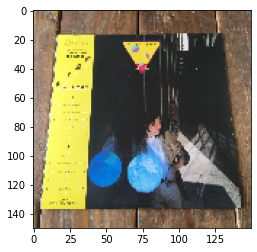

1/1 [==============================] - 0s 32ms/step
Tatsuro Yamashita - Moonglow , 100.00
m45445094887.jpg: Tatsuro Yamashita - Moonglow
True
 
--------------------------------------------------------------
 
File name : m67845248416.jpg


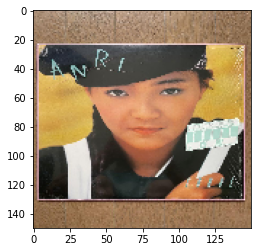

1/1 [==============================] - 0s 30ms/step
Anri (2) - Coool , 99.99
m67845248416.jpg: Anri (2) - Coool
True
 
--------------------------------------------------------------
 
File name : m94222835900.jpg


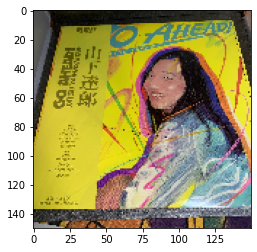

1/1 [==============================] - 0s 34ms/step
Tatsuro Yamashita - Go Ahead! , 100.00
m94222835900.jpg: Tatsuro Yamashita - Go Ahead!
True
 
--------------------------------------------------------------
 
File name : m69321241465.jpg


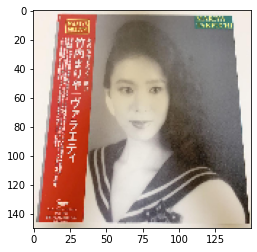

1/1 [==============================] - 0s 35ms/step
Utada Hikaru - First Love , 91.69
m69321241465.jpg: Utada Hikaru - First Love
False
 
--------------------------------------------------------------
 
File name : m25206781621.jpg


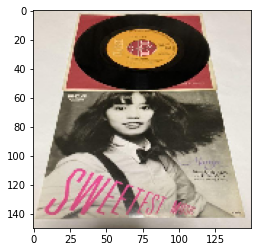

1/1 [==============================] - 0s 30ms/step
Taeko Ohnuki - Romantique , 87.07
m25206781621.jpg: Taeko Ohnuki - Romantique
False
 
--------------------------------------------------------------
 
File name : m82116820522.jpg


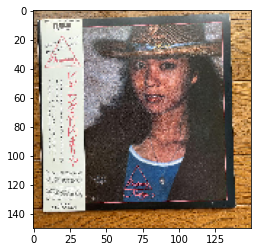

1/1 [==============================] - 0s 35ms/step
Anri (2) - Bi・Ki・Ni , 99.22
m82116820522.jpg: Anri (2) - Bi・Ki・Ni
False
 
--------------------------------------------------------------
 
File name : m81427430861.jpg


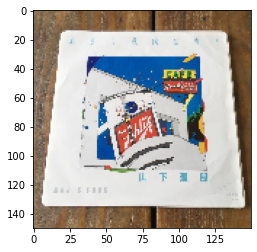

1/1 [==============================] - 0s 40ms/step
Utada Hikaru - Badモード , 92.74
m81427430861.jpg: Utada Hikaru - Badモード
False
 
--------------------------------------------------------------
 
File name : m58030722691.jpg


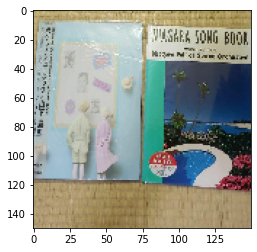

1/1 [==============================] - 0s 37ms/step
Hiroshi Sato - Future File , 83.63
m58030722691.jpg: Hiroshi Sato - Future File
False
 
--------------------------------------------------------------
 
File name : m56448785843.jpg


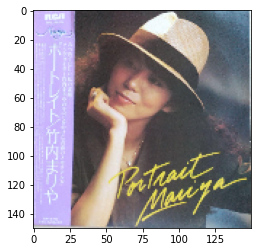

1/1 [==============================] - 0s 35ms/step
Tatsuro Yamashita - On The Street Corner , 81.69
m56448785843.jpg: Tatsuro Yamashita - On The Street Corner
False
 
--------------------------------------------------------------
 
File name : m84780693546.jpg


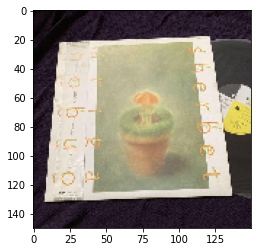

1/1 [==============================] - 0s 34ms/step
Taeko Ohnuki - Sunshower , 91.30
m84780693546.jpg: Taeko Ohnuki - Sunshower
False
 
--------------------------------------------------------------
 
File name : m92370877764.jpg


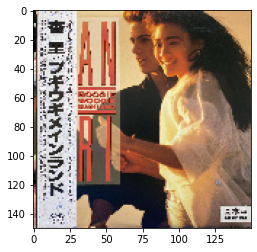

1/1 [==============================] - 0s 34ms/step
Anri (2) - Wave , 83.97
m92370877764.jpg: Anri (2) - Wave
False
 
--------------------------------------------------------------
 
File name : m66822781444.jpg


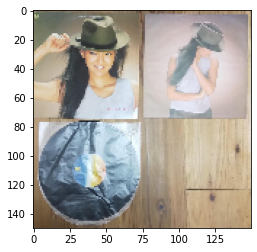

1/1 [==============================] - 0s 31ms/step
Cannot define , 32.11
m66822781444.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m54543532057.jpg


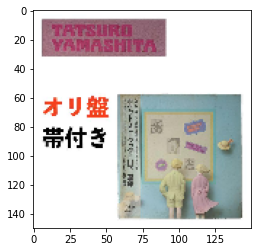

1/1 [==============================] - 0s 30ms/step
Utada Hikaru - Badモード , 90.87
m54543532057.jpg: Utada Hikaru - Badモード
False
 
--------------------------------------------------------------
 
File name : m88038628194.jpg


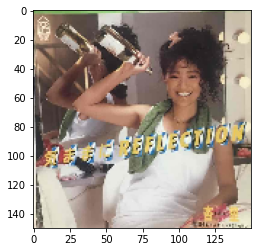

1/1 [==============================] - 0s 37ms/step
Taeko Ohnuki - Sunshower , 95.53
m88038628194.jpg: Taeko Ohnuki - Sunshower
False
 
--------------------------------------------------------------
 
File name : m85069650283.jpg


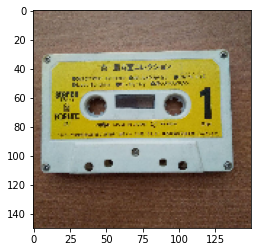

1/1 [==============================] - 0s 49ms/step
Tatsuro Yamashita - Melodies , 100.00
m85069650283.jpg: Tatsuro Yamashita - Melodies
False
 
--------------------------------------------------------------
 
File name : m51852063352.jpg


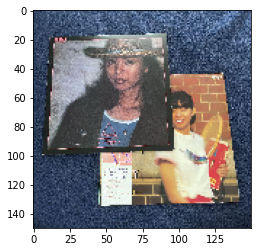

1/1 [==============================] - 0s 29ms/step
Cannot define , 32.84
m51852063352.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m52637126854.jpg


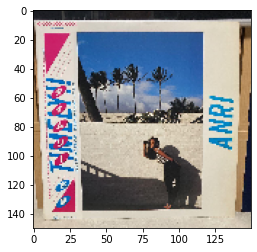

1/1 [==============================] - 0s 38ms/step
Anri (2) - Timely!! , 100.00
m52637126854.jpg: Anri (2) - Timely!!
False
 
--------------------------------------------------------------
 
File name : m39782839257.jpg


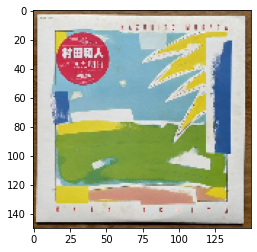

1/1 [==============================] - 0s 35ms/step
Tatsuro Yamashita - Spacy , 95.51
m39782839257.jpg: Tatsuro Yamashita - Spacy
False
 
--------------------------------------------------------------
 
File name : m30541527223.jpg


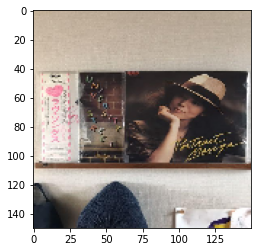

1/1 [==============================] - 0s 32ms/step
Momoko Kikuchi - Adventure , 83.78
m30541527223.jpg: Momoko Kikuchi - Adventure
False
 
--------------------------------------------------------------
 
File name : m95517704439.jpg


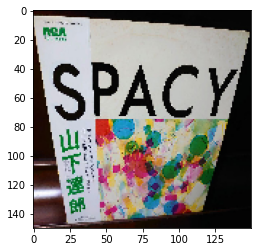

1/1 [==============================] - 0s 34ms/step
Tatsuro Yamashita - Spacy , 99.97
m95517704439.jpg: Tatsuro Yamashita - Spacy
True
 
--------------------------------------------------------------
 
File name : m54394001521.jpg


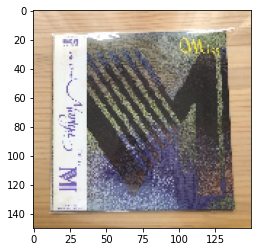

1/1 [==============================] - 0s 39ms/step
Utada Hikaru - Badモード , 89.86
m54394001521.jpg: Utada Hikaru - Badモード
False
 
--------------------------------------------------------------
 
File name : m24756349373.jpg


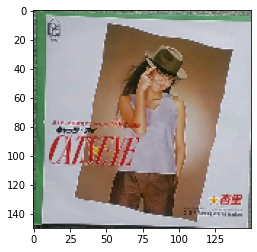

1/1 [==============================] - 0s 38ms/step
Cannot define , 44.40
m24756349373.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m73714487725.jpg


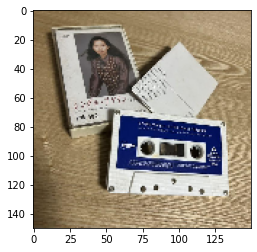

1/1 [==============================] - 0s 31ms/step
Cannot define , 52.57
m73714487725.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m33330699667.jpg


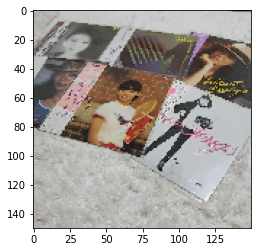

1/1 [==============================] - 0s 39ms/step
Taeko Ohnuki - Sunshower , 75.49
m33330699667.jpg: Taeko Ohnuki - Sunshower
False
 
--------------------------------------------------------------
 
File name : m95201887356.jpg


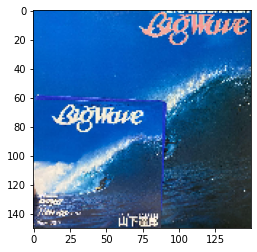

1/1 [==============================] - 0s 40ms/step
Tatsuro Yamashita - For You , 99.75
m95201887356.jpg: Tatsuro Yamashita - For You
False
 
--------------------------------------------------------------
 
File name : m46335582812.jpg


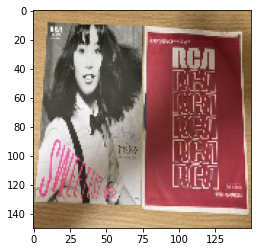

1/1 [==============================] - 0s 32ms/step
Mariya Takeuchi - Beginning , 100.00
m46335582812.jpg: Mariya Takeuchi - Beginning
False
 
--------------------------------------------------------------
 
File name : m96466080135.jpg


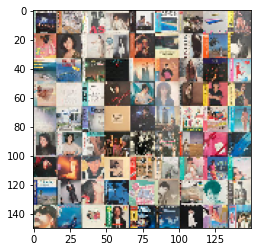

1/1 [==============================] - 0s 29ms/step
Cannot define , 23.89
m96466080135.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m17055471771.jpg


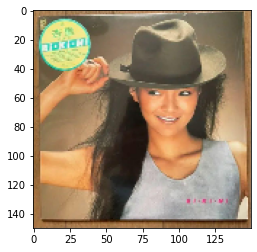

1/1 [==============================] - 0s 27ms/step
Anri (2) - Bi・Ki・Ni , 99.97
m17055471771.jpg: Anri (2) - Bi・Ki・Ni
True
 
--------------------------------------------------------------
 
File name : m11517590720.jpg


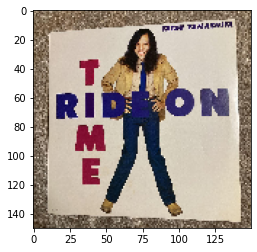

1/1 [==============================] - 0s 34ms/step
Cannot define , 39.52
m11517590720.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m12613888736.jpg


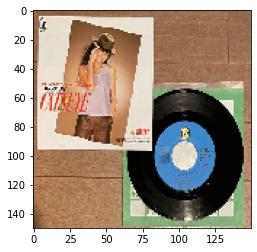

1/1 [==============================] - 0s 40ms/step
Cannot define , 38.29
m12613888736.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m51507727079.jpg


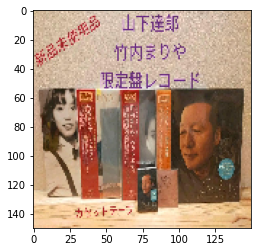

1/1 [==============================] - 0s 37ms/step
Cannot define , 69.03
m51507727079.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m95625025814.jpg


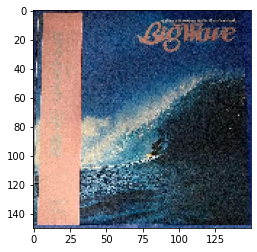

1/1 [==============================] - 0s 32ms/step
Tatsuro Yamashita - Big Wave = ビッグウェイブ , 100.00
m95625025814.jpg: Tatsuro Yamashita - Big Wave = ビッグウェイブ
True
 
--------------------------------------------------------------
 
File name : m93923434809.jpg


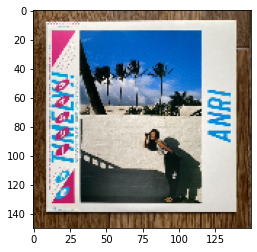

1/1 [==============================] - 0s 29ms/step
Anri (2) - Timely!! , 100.00
m93923434809.jpg: Anri (2) - Timely!!
True
 
--------------------------------------------------------------
 
File name : m64277008416.jpg


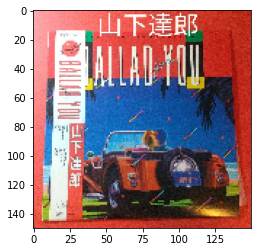

1/1 [==============================] - 0s 29ms/step
Cannot define , 39.48
m64277008416.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m54169379779.jpg


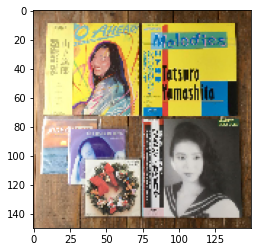

1/1 [==============================] - 0s 47ms/step
Cannot define , 63.75
m54169379779.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m27084446199.jpg


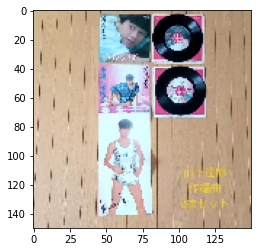

1/1 [==============================] - 0s 36ms/step
Cannot define , 48.17
m27084446199.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m36550320623.jpg


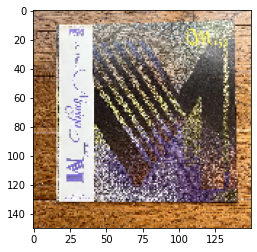

1/1 [==============================] - 0s 49ms/step
Cannot define , 40.59
m36550320623.jpg: Cannot define
False
 
--------------------------------------------------------------
 
File name : m53373119541.jpg


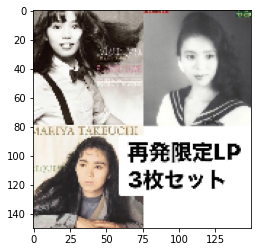

1/1 [==============================] - 0s 35ms/step
Tatsuro Yamashita - Ride On Time , 93.50
m53373119541.jpg: Tatsuro Yamashita - Ride On Time
False
 
--------------------------------------------------------------
 
File name : m56617323587.jpg


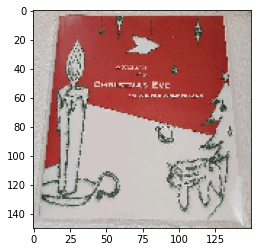

1/1 [==============================] - 0s 30ms/step
Mariya Takeuchi - University Street , 100.00
m56617323587.jpg: Mariya Takeuchi - University Street
False
 
--------------------------------------------------------------
 
File name : m82850227746.jpg


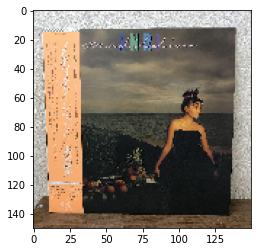

1/1 [==============================] - 0s 33ms/step
Cannot define , 69.00
m82850227746.jpg: Cannot define
True
 
--------------------------------------------------------------
 
File name : m75247892580.jpg


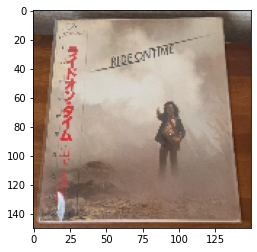

1/1 [==============================] - 0s 28ms/step
Cannot define , 57.97
m75247892580.jpg: Cannot define
False
 
--------------------------------------------------------------
 
68


In [16]:
mypath = "./raw_data/Test_CNN/"

onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
print(onlyfiles)

total_correct = 0

# predicting images
for file in onlyfiles:
    print('File name : ' + file)
    img = image.load_img(mypath+file, target_size=(img_width, img_height)) #150x150
    
    imgplot = plt.imshow(img)
    plt.show()
    
    x = image.img_to_array(img)
    x /= 255.0
    x = np.expand_dims(x, axis=0)
    
    images = np.vstack([x])
    classes = model.predict(images)
    true_class = df.loc[file,"class_num"]
    
    
    #1. load csv as a data frame
    #2. If the file == value from the dataframe (set the file name as an index) to check it is matched
    #3. Statement to check the predicted class is the same from annotated.
    
    #classes = model.predict_classes(images)
    #print(classes)
    #classes = classes[0][0]
    
    #    if np.argmax(classes)*100 <= 0.07:
    #    print("%s , %.2f" % ("Cannot define", (classes[0][np.argmax(classes)]*100)))
    #    print(file + ": " + 'Cannot define')



    if classes[0][np.argmax(classes)]*100 <= 70:
        prd = -1
    else:
        prd = np.argmax(classes)
    correct = prd==true_class
        
        
    if classes[0][np.argmax(classes)]*100 <= 70:
        print("%s , %.2f" % ("Cannot define", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Cannot define')
        
    elif np.argmax(classes) == 0:
        print("%s , %.2f" % ("Anri (2) - Bi・Ki・Ni", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Anri (2) - Bi・Ki・Ni')
    elif np.argmax(classes) == 1:
        print("%s , %.2f" % ("Anri (2) - Coool", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Anri (2) - Coool')
    elif np.argmax(classes) == 2:
        print("%s , %.2f" % ("Anri (2) - Timely!!", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Anri (2) - Timely!!')
    elif np.argmax(classes) == 3:
        print("%s , %.2f" % ("Anri (2) - Wave", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Anri (2) - Wave')
    elif np.argmax(classes) == 4:
        print("%s , %.2f" % ("Hiroshi Sato - Aqua", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Hiroshi Sato - Aqua')
    elif np.argmax(classes) == 5:
        print("%s , %.2f" % ("Hiroshi Sato - Awakening", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Hiroshi Sato - Awakening')
    elif np.argmax(classes) == 6:
        print("%s , %.2f" % ("Hiroshi Sato - Future File", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Hiroshi Sato - Future File')
    elif np.argmax(classes) == 7:
        print("%s , %.2f" % ("Hiroshi Sato - Sound Of Science", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Hiroshi Sato - Sound Of Science')
    elif np.argmax(classes) == 8:
        print("%s , %.2f" % ("Mariya Takeuchi - Beginning", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - Beginning')
    elif np.argmax(classes) == 9:
        print("%s , %.2f" % ("Mariya Takeuchi - Love Songs", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - Love Songs')
    elif np.argmax(classes) == 10:
        print("%s , %.2f" % ("Mariya Takeuchi - Miss M", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - Miss M')
    elif np.argmax(classes) == 11:
        print("%s , %.2f" % ("Mariya Takeuchi - Request", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - Request')
    elif np.argmax(classes) == 12:
        print("%s , %.2f" % ("Mariya Takeuchi - Trad = トラッド", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - Trad = トラッド')
    elif np.argmax(classes) == 13:
        print("%s , %.2f" % ("Mariya Takeuchi - University Street", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Mariya Takeuchi - University Street')
    elif np.argmax(classes) == 14:
        print("%s , %.2f" % ("Momoko Kikuchi - Adventure", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Momoko Kikuchi - Adventure')
    elif np.argmax(classes) == 15:
        print("%s , %.2f" % ("Momoko Kikuchi - Escape From Dimension", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Momoko Kikuchi - Escape From Dimension')
    elif np.argmax(classes) == 16:
        print("%s , %.2f" % ("Momoko Kikuchi - Ocean Side", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Momoko Kikuchi - Ocean Side')
    elif np.argmax(classes) == 17:
        print("%s , %.2f" % ("Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Momoko Kikuchi - Tropic Of Capricorn =トロピック・オブ・カプリコーン 南回帰線')
    elif np.argmax(classes) == 18:
        print("%s , %.2f" % ("Taeko Ohnuki - Aventure", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Aventure')
    elif np.argmax(classes) == 19:
        print("%s , %.2f" % ("Taeko Ohnuki - Cliché", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Cliché')
    elif np.argmax(classes) == 20:
        print("%s , %.2f" % ("Taeko Ohnuki - Grey Skies", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Grey Skies')
    elif np.argmax(classes) == 21:
        print("%s , %.2f" % ("Taeko Ohnuki - Mignonne", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Mignonne')
    elif np.argmax(classes) == 22:
        print("%s , %.2f" % ("Taeko Ohnuki - Romantique", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Romantique')
    elif np.argmax(classes) == 23:
        print("%s , %.2f" % ("Taeko Ohnuki - Sunshower", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Taeko Ohnuki - Sunshower')
    elif np.argmax(classes) == 24:
        print("%s , %.2f" % ("Tatsuro Yamashita - Big Wave = ビッグウェイブ", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Big Wave = ビッグウェイブ')
    elif np.argmax(classes) == 25:
        print("%s , %.2f" % ("Tatsuro Yamashita - Circus Town", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Circus Town')
    elif np.argmax(classes) == 26:
        print("%s , %.2f" % ("Tatsuro Yamashita - For You", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - For You')
    elif np.argmax(classes) == 27:
        print("%s , %.2f" % ("Tatsuro Yamashita - Go Ahead!", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Go Ahead!')
    elif np.argmax(classes) == 28:
        print("%s , %.2f" % ("Tatsuro Yamashita - It's A Poppin' Time", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + "Tatsuro Yamashita - It's A Poppin' Time")
    elif np.argmax(classes) == 29:
        print("%s , %.2f" % ("Tatsuro Yamashita - Melodies", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Melodies')
    elif np.argmax(classes) == 30:
        print("%s , %.2f" % ("Tatsuro Yamashita - Moonglow", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Moonglow')
    elif np.argmax(classes) == 31:
        print("%s , %.2f" % ("Tatsuro Yamashita - On The Street Corner", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - On The Street Corner')
    elif np.argmax(classes) == 32:
        print("%s , %.2f" % ("Tatsuro Yamashita - On The Street Corner 2", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - On The Street Corner 2')
    elif np.argmax(classes) == 33:
        print("%s , %.2f" % ("Tatsuro Yamashita - Ride On Time", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Ride On Time')
    elif np.argmax(classes) == 34:
        print("%s , %.2f" % ("Tatsuro Yamashita - Softly", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Softly')
    elif np.argmax(classes) == 35:
        print("%s , %.2f" % ("Tatsuro Yamashita - Spacy", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Tatsuro Yamashita - Spacy')
    elif np.argmax(classes) == 36:
        print("%s , %.2f" % ("Utada Hikaru - Badモード", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Utada Hikaru - Badモード')
    elif np.argmax(classes) == 37:
        print("%s , %.2f" % ("Utada Hikaru - Deep River", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Utada Hikaru - Deep River')
    elif np.argmax(classes) == 38:
        print("%s , %.2f" % ("Utada Hikaru - First Love", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Utada Hikaru - First Love')
    elif np.argmax(classes) == 39:
        print("%s , %.2f" % ("Various - Classic Jazz-Funk Mastercuts Volume 7", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + 'Various - Classic Jazz-Funk Mastercuts Volume 7')
    elif np.argmax(classes) == 40:
        print("%s , %.2f" % ("東北新幹線 - Thru Traffic", (classes[0][np.argmax(classes)]*100)))
        print(file + ": " + '東北新幹線 - Thru Traffic')
        
    print(correct)
    total_correct+=correct    
    
    print(' ')
    print('--------------------------------------------------------------')
    print(' ')
    
print(total_correct)